# Jupyter Notebook to control a Canon camera via CCAPI

Author: Gregor von Laszewski
e-mail: laszewski@gmail.com

Please acknowledge me if you use this software or create derivations from it.

## Abstract

Here we describe how to control your Canon cameras using the CCAPI for
supported cameras. We assume you have activated CCAP on your Canon
camera (A separate article will follow on how to do that if there is demand for it).

We also assume you have connected your camera to your local WiFi
network and obtained an IP address that you will use and modify
the example accordingly.

## Imports

First, let us import the packages for this demo

In [1]:
import pandas as pd
from io import StringIO
from datetime import datetime
import ipywidgets as widgets
from IPython.display import Image, display

from ccapi.ccapi import CCAPI
from ccapi.ccapi import df_from_csv

## Obtain and Set the IP address

Make sure to identify from your camera the IP address on your
local network so you can connect to it.
You can also set it in an environment variable on the terminal such as

```export CANON_IP="192.168.50.210"```
```ip = os.environ["CANON_IP"]```

In that case, you do not have to use the IP variable in the CCAPI
class.

Now create a camera object as follows. Change the IP as appropriate.

In [2]:
ip="192.168.50.210"
camera = CCAPI(ip=ip, debug=False)

## List the CCAPI

You can list the available CCAPI URLs and convert them to a pandas
dataframe for a convenient table listing. It lists also if get, put,
post, and delete are available. This table helps adding new features
to the python CCAPI class as I only implemented a subset. If you have
additions, please help adding them. Coordinate with me and/or make
a pull request.

In [3]:
df = camera.ccapi(output="df")
df

,version,path,get,put,post,delete
0,ver100,/ccapi/ver100/deviceinformation,True,False,False,False
1,ver100,/ccapi/ver100/devicestatus/battery,True,False,False,False
2,ver100,/ccapi/ver100/devicestatus/lens,True,False,False,False
3,ver100,/ccapi/ver100/devicestatus/temperature,True,False,False,False
4,ver100,/ccapi/ver100/functions/registeredname/copyright,True,True,False,True
...,...,...,...,...,...,...
94,ver110,/ccapi/ver110/customfunction/exposureincrement...,True,False,False,False
95,ver110,/ccapi/ver110/customfunction/exposureincrement...,True,False,False,False
96,ver110,/ccapi/ver110/customfunction/isoincrements,True,False,False,False
97,ver110,/ccapi/ver110/shooting/control/flickerdetection,False,False,True,False


## Set and Get camera properties

Obviously, you want to quickly test out the CCAPI. The owner and author fields are a quick way to test things out.

All variables are set as properties so you can retrieve values for example for author) just with

```camera.author```

To set the value you can use an assignment such as

```camera.author = "Gregor von Laszewski"```

Before you do it, let us read out the current values.


In [4]:
author = camera.author
owner = camera.owner
copyright = camera.copyright
# nickname = camera.nickname

print(f"Author: {author}")
print(f"Owner: {owner}")
print(f"Copyright: {copyright}")
# print(f"Nickname: {nickname}")

Author: Gregor von Laszewski
Owner: Gregor von Laszewski
Copyright: laszewski@gmail.com


Other variables (may) also have a `get_` method to retrieve the JSON
information associated with that variable based on the CCAPI call.

We provide here an example for temperature. While the `get_temperature()`
function returns the JSON object. the `camera.temperature` property
just returns the value.

In [5]:
camera.get_temperature()

{'status': 'normal'}

In [6]:
camera.temperature

'normal'

We showcase here another variable, that stores the datetime from the camera.
The get_datetime() method returns what the JSON object contains. However,
certainly, we do not want to deal with the conversion to Python datetime.
Instead, the property camera.datetime can be used.

Note: setting of datetime is not yet supported. It is easy to implement.
I encourage you to help.

In [7]:
camera.get_datetime()

{'datetime': 'Sun, 05 Mar 2023 09:30:09 -0500', 'dst': True}

In [8]:
print(camera.datetime)
camera.datetime

2023-03-05 09:30:11


datetime.datetime(2023, 3, 5, 9, 30, 11)

## Informational get methods and properties

We demonstrate next a number of informational get methods and properties.

To get information about the lens use

In [9]:
camera.get_lens()

{'mount': True}

To get information about the storage SD Cards in the camera use

In [10]:
camera.get_storage()

[{'name': 'Card 1',
  'path': '/ccapi/ver110/contents/card1',
  'accesscapability': 'readwrite',
  'maxsize': '255.8 GB',
  'spacesize': '245.7 GB',
  'contentsnumber': 474}]

To get Information about the battery use

In [11]:
camera.get_battery(output="json")

{'position': 'camera',
 'kind': 'battery',
 'name': 'LP-E6NH',
 'quality': 'good',
 'level': '83'}

To get the charge level as integer use

In [12]:
camera.charge

83

In [13]:
camera.autopoweroff

'180'

## Camera Settings

The current camera settings can be conveniently probed with the command

```camera.get_settings()```

It returns a JSON object that is separated by the version of the CCAPI call.
This includes not only the value but also the ability, e.g. the range of
values that can be set for the camera model.

In addition, we added two properties for each setting. The kind of the
ability, e.g. if it is a selector, slider, or a list. These values can
then be used to automatically develop GUI interfaces for the properties
as we demonstrate later in this file.

Note: a sample for doing this for list has yet to be developed. Help
out and submit one.

The second is the API URL extension as some variables have an in it
which means that the API gets properly written by replacing them
with an `/` to formulate the URL for the internal get call.

However, this is a detail for developers that you may not need.


In [14]:
camera.get_settings()

{'ver110': {'stillimagequality': {'value': {'raw': 'craw', 'jpeg': 'none'},
   'ability': {'raw': ['none', 'raw', 'craw'],
    'jpeg': ['none',
     'large_fine',
     'large_normal',
     'medium_fine',
     'medium_normal',
     'small1_fine',
     'small1_normal',
     'small2']},
   'kind': 'unkown',
   'api': '/shooting/settings/stillimagequality'},
  'hdr': {'value': 'off',
   'ability': ['pq', 'off'],
   'kind': 'choice',
   'api': '/shooting/settings/hdr'},
  'shuttermode': {'value': 'elec_1st_curtain',
   'ability': ['elec_1st_curtain', 'mechanical', 'electronic'],
   'kind': 'choice',
   'api': '/shooting/settings/shuttermode'},
  'trackingsetting': {'value': 'enable',
   'ability': ['enable', 'disable'],
   'kind': 'choice',
   'api': '/shooting/settings/trackingsetting'},
  'highframerate': {'value': 'disable',
   'ability': ['disable'],
   'kind': 'choice',
   'api': '/shooting/settings/highframerate'},
  'antiflickershoot': {'value': 'disable',
   'ability': ['disable', '

### Camera settings properties

In contrast to the previous properties, we have not just returned
the value for those included in settings. This may change in the
future, but for now, we just return the JSON information from the
API call instead. This is useful during improving the interface.

In addition, when calling this method the settings will be written
into a file called

```canon-settings.json```

so you can work with a cached version of it.

Let me know what you think and how you would like to have it so
we can work on improving the interface.

Here are a number of examples


In [15]:
camera.exposuresmoothing
# get_exposuresmoothing will be implemented in future

{'value': 'enable', 'ability': ['disable', 'enable']}

In [16]:
camera.numberofshots
# get_numberofshots will be inmplemented in future

{'value': 100, 'ability': {'min': 2, 'max': 999, 'step': 1}}

In [17]:
camera.focusincrement

{'value': 4, 'ability': {'min': 1, 'max': 10, 'step': 1}}

In [18]:
camera.focusbracketing

{'value': 'disable', 'ability': ['disable', 'enable']}

### Convenience functions for interacting with settings

A number of convenient functions are available that simplify
interacting with settings. As it is inconvenient to remember which
version of CCAPI contains the property such as `av` a method
is available that allows to returning the version automatically.



In [19]:
camera.get_settings_version(key="av")

'ver100'

To get the value for `av`, for example, you can use the method

In [20]:
camera.get_settings_value(key="av")

{'value': 'f4.5',
 'ability': ['f3.5',
  'f4.0',
  'f4.5',
  'f5.0',
  'f5.6',
  'f6.3',
  'f7.1',
  'f8.0',
  'f9.0',
  'f10',
  'f11',
  'f13',
  'f14',
  'f16',
  'f18',
  'f20',
  'f22']}

This method includes the complete record stored in the camera
including the ability, but not the extensions with ave added
to the ```camera.get_settings()``` method we implemented.

To just retrieve the value you can use

In [21]:
camera.av

'f4.5'

A set method is also available in these two forms.
The first is a method so you can return the settings value by
key which may help implementing GUI interfaces easier.


In [22]:
camera.set_settings_value(key="av", value="f8.0")

'f8.0'

The second method is to probe the camera setting property

In [23]:
camera.av = "f4.0"
camera.av

'f4.0'

Internally, the abilities are used to prevent not allowed
not values. Let us demonstrate by setting av to f0.0.
In this case, a message failed is written and the existing
value is returned.

Note: In the future, we may add an exception method, but
for now the interface seems good enough

In [24]:
camera.av = "f0.0"
camera.av

failed


'f4.0'

Certainly this is possible for other properties such as


In [25]:
camera.tv

'1/8000'

In [26]:
camera.iso

'auto'

In [27]:
camera.wb

'auto'

In [28]:
camera.afmethod

'spot'

In [29]:
camera.drive

'single'

In [30]:
camera.aeb

'+0.0'

In [31]:
camera.colorspace

'srgb'

In [32]:
camera.metering

'evaluative'

In [33]:
camera.stillimageaspectratio

'3:2'

In [34]:
camera.afoperation

'servo'

In [35]:
camera.shuttermode

'elec_1st_curtain'

You can even return the value of the shooting mode that you
can set via the dial knob on the camera

In [36]:
camera.get_shootingmodedial()

{'value': 'm', 'ability': ['m']}

In [37]:
camera.shootingmodedial

'm'

## Generating ipywidgets

Certainly, it is possible to develop individual ipywidgets for
creating GUI-like interfaces to the settings. But we can also
automate the process. We showcase here some examples using some
internal methods provided by our python implementation.

As some of the possible values can be numerous, it seems better
to make sure the GUI components use horizontal rendering which
is achieved with

In [38]:
%%html
<style>
    .widget-radio-box {
        flex-direction: row !important;
    }
    .widget-radio-box label{
        margin:5px !important;
        width: 180px !important;
    }
</style>

In [39]:
w = camera.gui(key="shuttermode")

RadioButtons(description='shuttermode:', options=('elec_1st_curtain', 'mechanical', 'electronic'), value='elec…

Once you change the values you can update the camera settings as follows

In [40]:
camera.shuttermode = w.value
camera.shuttermode

'elec_1st_curtain'

To showcase a slider, lets use the color

In [41]:
w = camera.gui(key="colortemperature")

failed


IntSlider(value=5200, continuous_update=False, description='colortemperature:', max=10000, min=2500, step=100)

We are not setting this value here but you could use similarly to the shuttermode

```
camera.colortemperature = w.value
camera.colortemperature
```

## Taking Pictures

### Liveview Still Image

It is possible to take a look through the camera in liveview while
using a still image. Live view can be performed in a small or medium
size image. Let us set the defualt to "medium" with


In [42]:
r = camera.liveview(display="on", size="medium")

Next let us get the image which we store in a file called "preview.jpeg"

In [43]:
#camera.release()
camera.get_liveview_image("preview.jpg")
i = camera.preview("preview.jpg")

In [44]:
print (i)

None


In [45]:
# camera.liveview()

# camera.get_image(name)
# camera.preview(name)
# r = camera.shoot()

In [46]:
camera.liveview()

<Response [200]>

## Listing the contents

To List the contents we have a method contents() that returns a list
of all images on any  card in the camera

In [47]:
images = camera.contents()
images

['/ccapi/ver110/contents/card1/100EOSR7/2Z7A0224.CR3',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0224.JPG',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0226.CR3',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0226.JPG',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0227.CR3',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0227.JPG',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0228.CR3',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0228.JPG',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0232.CR3',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0232.JPG',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0233.CR3',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0233.JPG',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0234.CR3',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0234.JPG',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0235.CR3',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0235.JPG',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0236.CR3',
 '/ccapi/ver110/contents/card1/100EOSR7/2Z7A0236.JPG',
 '/ccapi/v

To display an image you can simply use the Jupyter notebook
image function. Let us display the third image in the list,
let us first download the image and then display it.

The image is stored in an IPython.display.Image object so it
can be displayed easily.


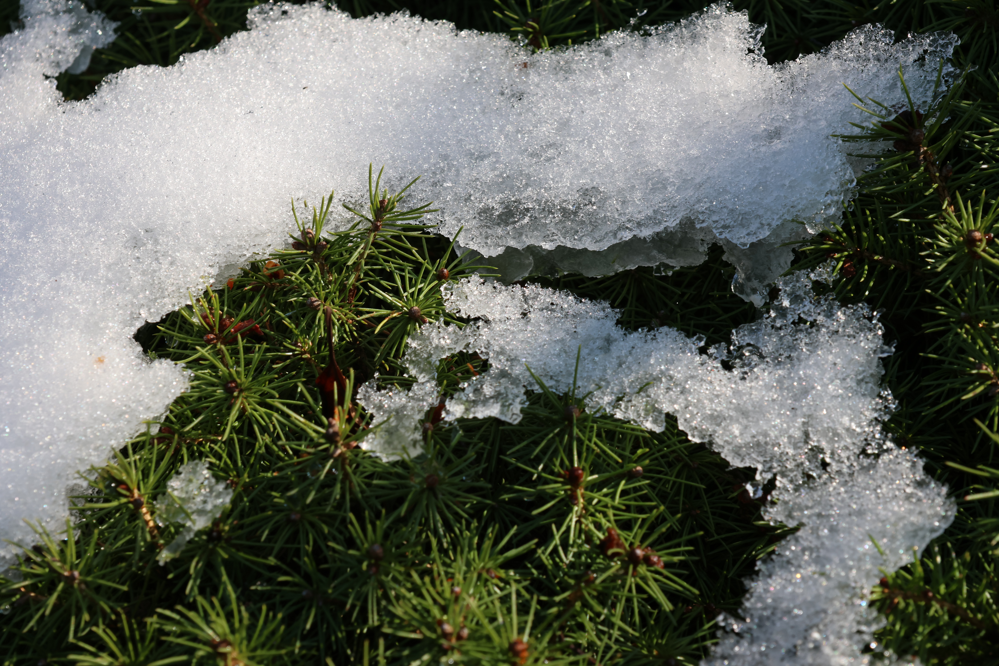

In [48]:
no = 3
image = images[no]
camera.download(image)
i = camera.load(image)
display(i)

However, we can also use the display function build into our API.

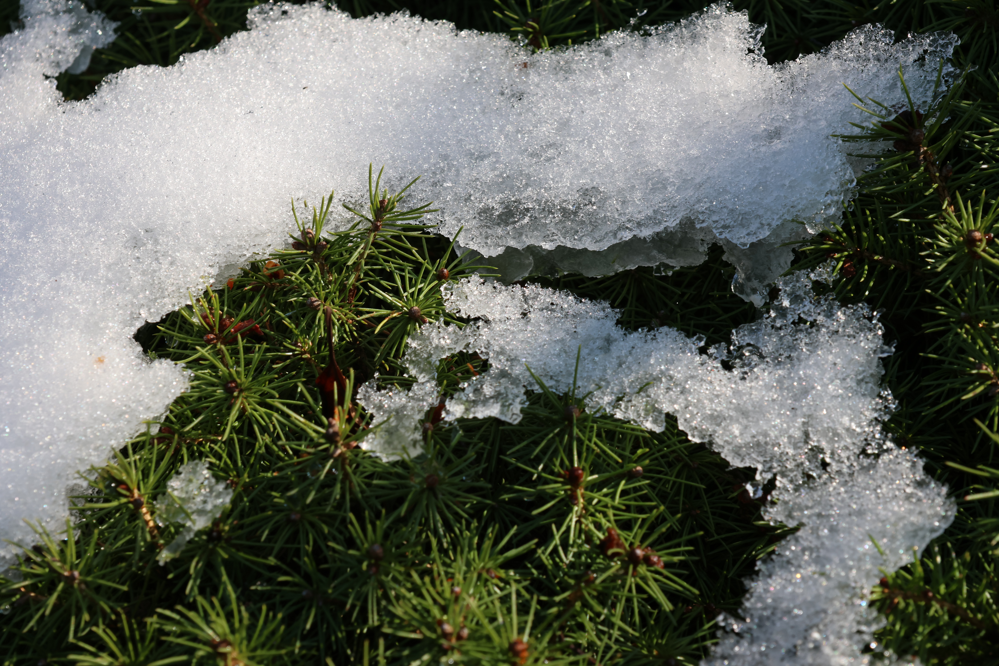

In [49]:
camera.display(image)